# PREDICTION DU PRIX DE L'OR, TOUTES LES VARIABLES 

Tache effectuées :
   * a) Identification de la target
   * b) Nombre des lignes et de colones
   * c) Identification des valeurs manquantes
   * d) Types de variables
   * e) Visualisation de la cible
   * f) Comprehension des differentes variables
   * g) Visualisation des relations: features/target
   * h) Identification des outliers

### CHARGEMENT DES BIBLIOTHEQUES

In [50]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.metrics import classification_report, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import learning_curve

### CHARGEMENT DU DATASET

In [2]:
# Importation et indexation temporelle

dataframe = pd.read_csv("FINAL_USO.csv", index_col = "Date", parse_dates = True)
dataframe

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,...,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,...,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,...,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,...,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,...,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,119.570000,120.139999,119.570000,120.019997,120.019997,9736400,239.039993,240.839996,234.270004,234.339996,...,20.650000,21.090000,21.090000,60507000,9.490000,9.520000,9.280000,9.290000,9.290000,21598200
2018-12-26,120.620003,121.000000,119.570000,119.660004,119.660004,14293500,235.970001,246.179993,233.759995,246.179993,...,20.530001,20.620001,20.620001,76365200,9.250000,9.920000,9.230000,9.900000,9.900000,40978800
2018-12-27,120.570000,120.900002,120.139999,120.570000,120.570000,11874400,242.570007,248.289993,238.960007,248.070007,...,20.700001,20.969999,20.969999,52393000,9.590000,9.650000,9.370000,9.620000,9.620000,36578700


In [3]:
# Nombre de lignes et de colones

dataframe.shape

(1718, 80)

In [4]:
# verification des valeurs manquantes dans tout le dataset

dataframe.isna().sum().any()

False

In [5]:
# Affiche la liste des colones contenant des valeurs manquantes

dataframe.columns[dataframe.isna().any()]

Index([], dtype='object')

In [6]:
# verification des valeurs nulles dans tout le dataset

dataframe.isnull().sum().any()

False

In [7]:
# types des variables

dataframe.dtypes

Open             float64
High             float64
Low              float64
Close            float64
Adj Close        float64
                  ...   
USO_High         float64
USO_Low          float64
USO_Close        float64
USO_Adj Close    float64
USO_Volume         int64
Length: 80, dtype: object

In [8]:
# informations sur les données
print(dataframe.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1718 entries, 2011-12-15 to 2018-12-31
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Open           1718 non-null   float64
 1   High           1718 non-null   float64
 2   Low            1718 non-null   float64
 3   Close          1718 non-null   float64
 4   Adj Close      1718 non-null   float64
 5   Volume         1718 non-null   int64  
 6   SP_open        1718 non-null   float64
 7   SP_high        1718 non-null   float64
 8   SP_low         1718 non-null   float64
 9   SP_close       1718 non-null   float64
 10  SP_Ajclose     1718 non-null   float64
 11  SP_volume      1718 non-null   int64  
 12  DJ_open        1718 non-null   float64
 13  DJ_high        1718 non-null   float64
 14  DJ_low         1718 non-null   float64
 15  DJ_close       1718 non-null   float64
 16  DJ_Ajclose     1718 non-null   float64
 17  DJ_volume      1718 non-null   int

### Visualisation de la variable cible

In [9]:
dataframe

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,...,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,...,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,...,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,...,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,...,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,119.570000,120.139999,119.570000,120.019997,120.019997,9736400,239.039993,240.839996,234.270004,234.339996,...,20.650000,21.090000,21.090000,60507000,9.490000,9.520000,9.280000,9.290000,9.290000,21598200
2018-12-26,120.620003,121.000000,119.570000,119.660004,119.660004,14293500,235.970001,246.179993,233.759995,246.179993,...,20.530001,20.620001,20.620001,76365200,9.250000,9.920000,9.230000,9.900000,9.900000,40978800
2018-12-27,120.570000,120.900002,120.139999,120.570000,120.570000,11874400,242.570007,248.289993,238.960007,248.070007,...,20.700001,20.969999,20.969999,52393000,9.590000,9.650000,9.370000,9.620000,9.620000,36578700


### Normalisation des données

In [10]:
transformer = RobustScaler().fit(dataframe)
data = transformer.transform(dataframe)

In [11]:
dataframe

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,...,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,...,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,...,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,...,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,...,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,119.570000,120.139999,119.570000,120.019997,120.019997,9736400,239.039993,240.839996,234.270004,234.339996,...,20.650000,21.090000,21.090000,60507000,9.490000,9.520000,9.280000,9.290000,9.290000,21598200
2018-12-26,120.620003,121.000000,119.570000,119.660004,119.660004,14293500,235.970001,246.179993,233.759995,246.179993,...,20.530001,20.620001,20.620001,76365200,9.250000,9.920000,9.230000,9.900000,9.900000,40978800
2018-12-27,120.570000,120.900002,120.139999,120.570000,120.570000,11874400,242.570007,248.289993,238.960007,248.070007,...,20.700001,20.969999,20.969999,52393000,9.590000,9.650000,9.370000,9.620000,9.620000,36578700


In [12]:
#, columns = dataframe.columns, index = dataframe.index)
df = pd.DataFrame(data, columns = dataframe.columns, index = dataframe.index )

In [13]:
df.head()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-15,2.688923,2.600120,2.507438,2.459030,2.459030,2.927618,-1.232212,-1.247154,-1.238396,-1.253525,...,4.454793,4.251764,4.175865,-0.485849,0.889131,0.876443,0.877247,0.859283,0.859283,-0.171436
2011-12-16,2.653698,2.633593,2.688429,2.692571,2.692571,2.219050,-1.244170,-1.250899,-1.248761,-1.262398,...,4.527746,4.400297,4.326350,-0.611542,0.857826,0.857451,0.863218,0.865364,0.865364,-0.173285
2011-12-19,2.749540,2.672645,2.726446,2.663579,2.663579,1.055949,-1.246711,-1.260336,-1.267838,-1.281949,...,4.370974,4.176012,4.099116,-0.645443,0.866957,0.855293,0.871986,0.862324,0.862324,-0.425092
2011-12-20,2.859310,2.797769,2.909917,2.833501,2.833501,0.344607,-1.244918,-1.233074,-1.262731,-1.227206,...,4.578968,4.446343,4.373001,-0.746555,0.906522,0.905363,0.928540,0.921390,0.921390,-0.297086
2011-12-21,2.872416,2.805739,2.872727,2.847997,2.847997,0.941017,-1.218759,-1.229778,-1.226979,-1.223597,...,4.586729,4.441887,4.368486,-0.831528,0.922609,0.932557,0.941692,0.945277,0.945277,-0.263593


In [14]:
dataframe = df.copy()

In [15]:
dataframe.head()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-15,2.688923,2.600120,2.507438,2.459030,2.459030,2.927618,-1.232212,-1.247154,-1.238396,-1.253525,...,4.454793,4.251764,4.175865,-0.485849,0.889131,0.876443,0.877247,0.859283,0.859283,-0.171436
2011-12-16,2.653698,2.633593,2.688429,2.692571,2.692571,2.219050,-1.244170,-1.250899,-1.248761,-1.262398,...,4.527746,4.400297,4.326350,-0.611542,0.857826,0.857451,0.863218,0.865364,0.865364,-0.173285
2011-12-19,2.749540,2.672645,2.726446,2.663579,2.663579,1.055949,-1.246711,-1.260336,-1.267838,-1.281949,...,4.370974,4.176012,4.099116,-0.645443,0.866957,0.855293,0.871986,0.862324,0.862324,-0.425092
2011-12-20,2.859310,2.797769,2.909917,2.833501,2.833501,0.344607,-1.244918,-1.233074,-1.262731,-1.227206,...,4.578968,4.446343,4.373001,-0.746555,0.906522,0.905363,0.928540,0.921390,0.921390,-0.297086
2011-12-21,2.872416,2.805739,2.872727,2.847997,2.847997,0.941017,-1.218759,-1.229778,-1.226979,-1.223597,...,4.586729,4.441887,4.368486,-0.831528,0.922609,0.932557,0.941692,0.945277,0.945277,-0.263593


<AxesSubplot:xlabel='Date'>

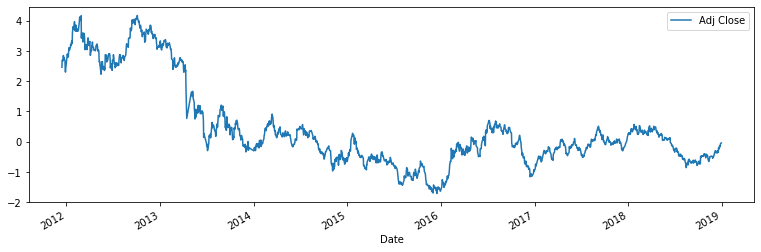

In [16]:
# Visualisation de la variable cible 

dataframe.plot(y=['Adj Close'], figsize=(13,4)) 

Date
2012-01-08    AxesSubplot(0.125,0.125;0.775x0.755)
2012-01-15    AxesSubplot(0.125,0.125;0.775x0.755)
2012-01-22    AxesSubplot(0.125,0.125;0.775x0.755)
2012-01-29    AxesSubplot(0.125,0.125;0.775x0.755)
2012-02-05    AxesSubplot(0.125,0.125;0.775x0.755)
2012-02-12    AxesSubplot(0.125,0.125;0.775x0.755)
2012-02-19    AxesSubplot(0.125,0.125;0.775x0.755)
2012-02-26    AxesSubplot(0.125,0.125;0.775x0.755)
2012-03-04    AxesSubplot(0.125,0.125;0.775x0.755)
2012-03-11    AxesSubplot(0.125,0.125;0.775x0.755)
2012-03-18    AxesSubplot(0.125,0.125;0.775x0.755)
2012-03-25    AxesSubplot(0.125,0.125;0.775x0.755)
2012-04-01    AxesSubplot(0.125,0.125;0.775x0.755)
2012-04-08    AxesSubplot(0.125,0.125;0.775x0.755)
2012-04-15    AxesSubplot(0.125,0.125;0.775x0.755)
2012-04-22    AxesSubplot(0.125,0.125;0.775x0.755)
2012-04-29    AxesSubplot(0.125,0.125;0.775x0.755)
2012-05-06    AxesSubplot(0.125,0.125;0.775x0.755)
2012-05-13    AxesSubplot(0.125,0.125;0.775x0.755)
2012-05-20    AxesSubplot(

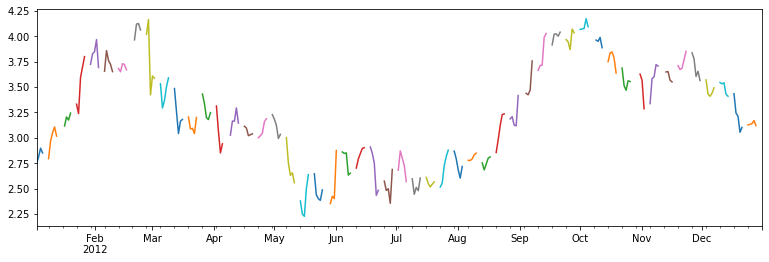

In [17]:
dataframe.loc['2012', 'Adj Close'].resample('W').plot(y=['Adj Close'], figsize=(13,4))

###  Visualisation des relations : features/target 

<AxesSubplot:xlabel='Date'>

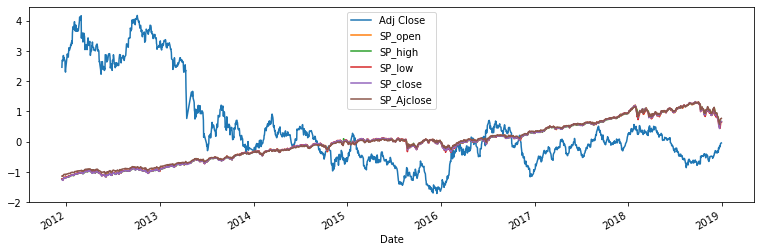

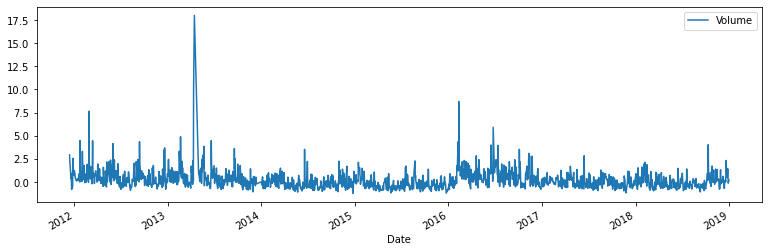

In [18]:
# Visualisation de la variable cible avec S&P500

dataframe.plot(y=['Adj Close','SP_open', 'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose'], figsize=(13,4))
dataframe.plot(y=['Volume'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

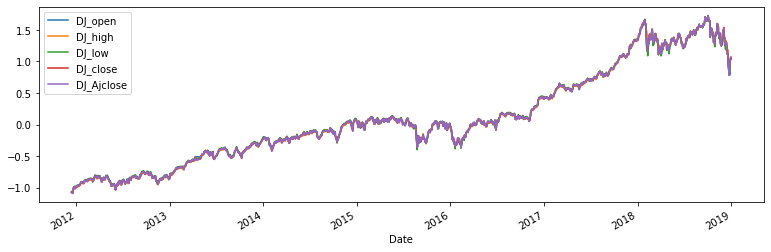

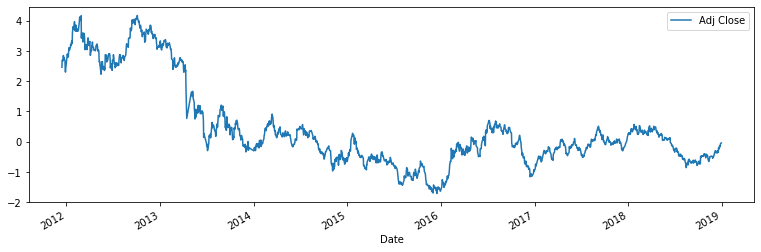

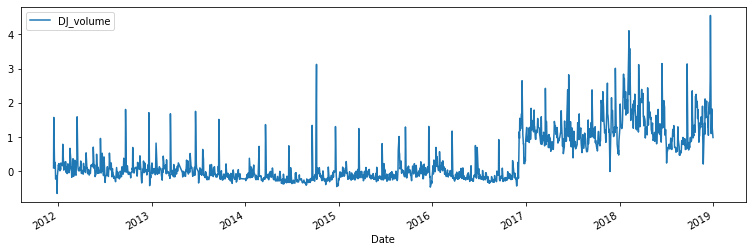

In [19]:
# Visualisation de la variable cible avec DJ30

dataframe.plot(y=['DJ_open','DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['DJ_volume'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

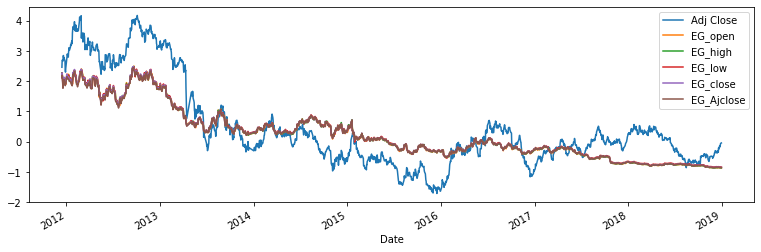

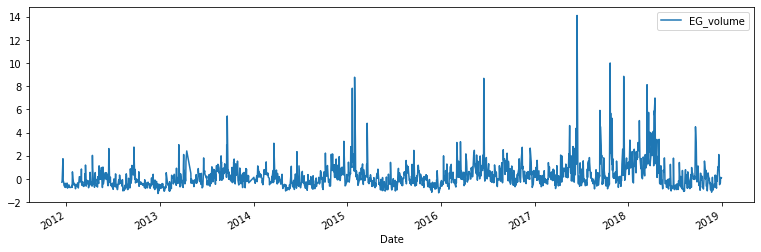

In [20]:
# Visualisation de la variable cible avec EGC (Eldorado Gold Corporation)

dataframe.plot(y=['Adj Close','EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose'], figsize=(13,4))
dataframe.plot(y=['EG_volume'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

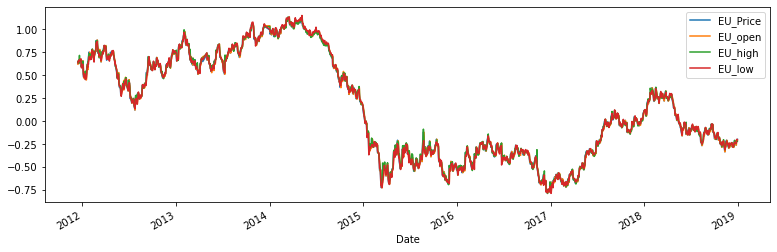

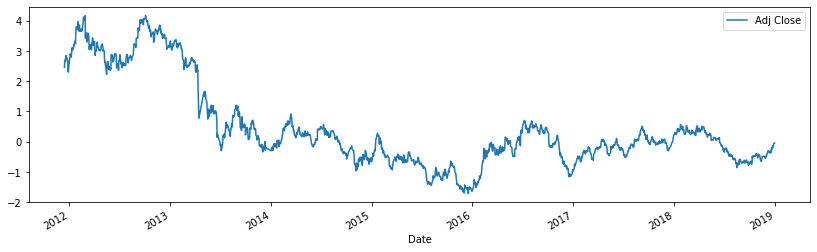

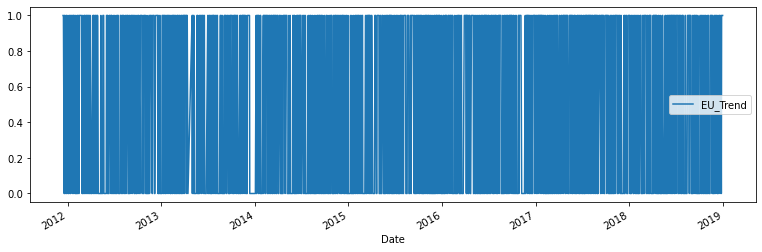

In [21]:
# Visualisation de la variable cible avec EU

dataframe.plot(y=['EU_Price', 'EU_open', 'EU_high', 'EU_low'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(14,4))
dataframe.plot(y=['EU_Trend'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

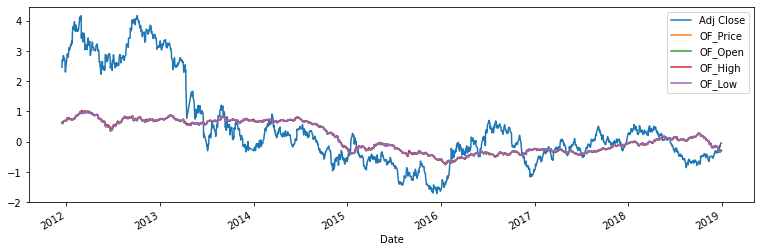

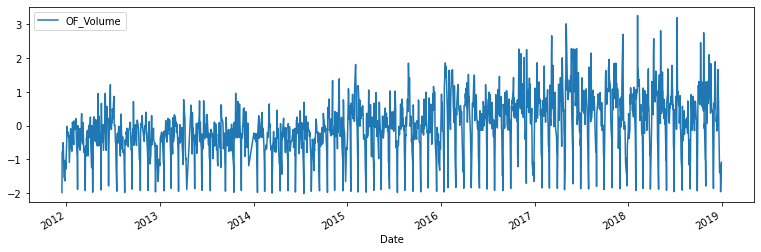

In [22]:
# Visualisation de la variable cible avec le petrol brut (contrat à terme)

dataframe.plot(y=['Adj Close', 'OF_Price', 'OF_Open', 'OF_High', 'OF_Low'], figsize=(13,4))
dataframe.plot(y=['OF_Volume'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

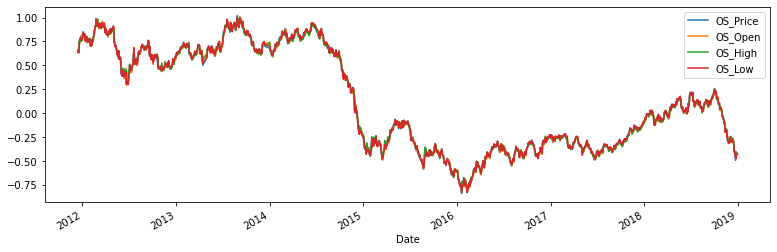

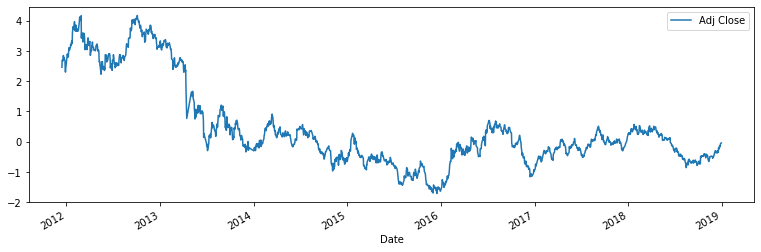

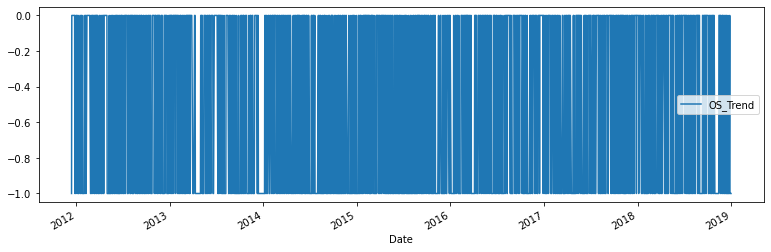

In [23]:
# Visualisation de la variable cible avec le petrol brut

dataframe.plot(y=['OS_Price', 'OS_Open', 'OS_High', 'OS_Low'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['OS_Trend'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

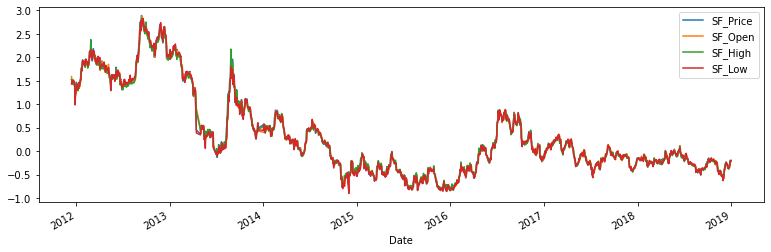

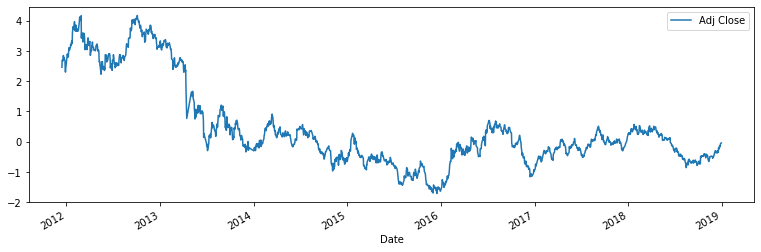

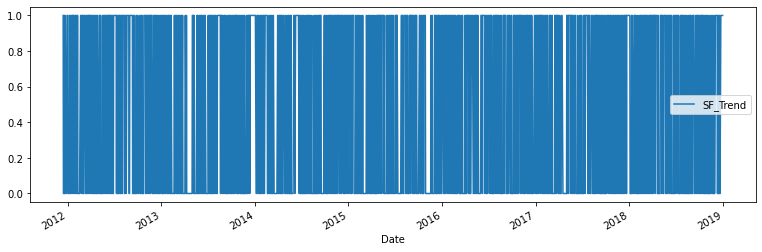

In [24]:
# Visualisation de la variable cible avec le prix du metal argent

dataframe.plot(y=['SF_Price', 'SF_Open', 'SF_High', 'SF_Low'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['SF_Trend'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

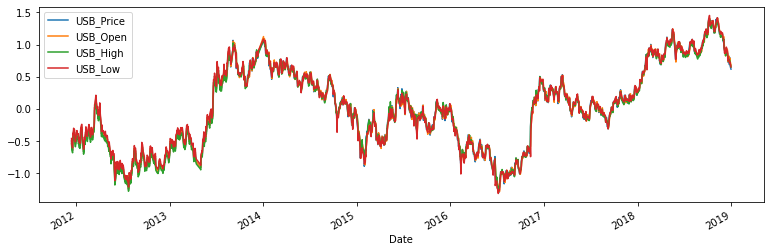

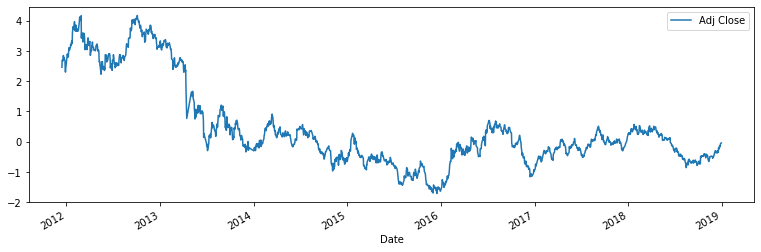

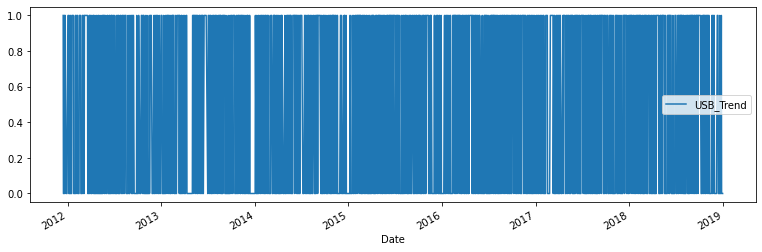

In [25]:
# Visualisation de la variable cible avec le bonds du tresor americain

dataframe.plot(y=['USB_Price', 'USB_Open', 'USB_High', 'USB_Low'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['USB_Trend'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

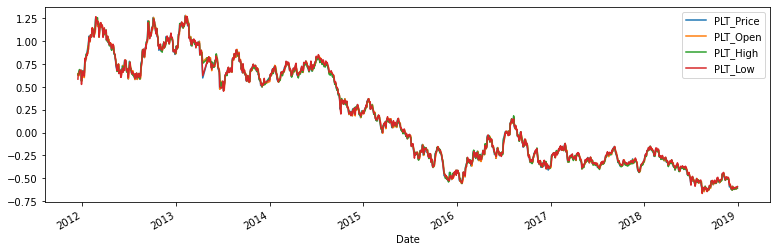

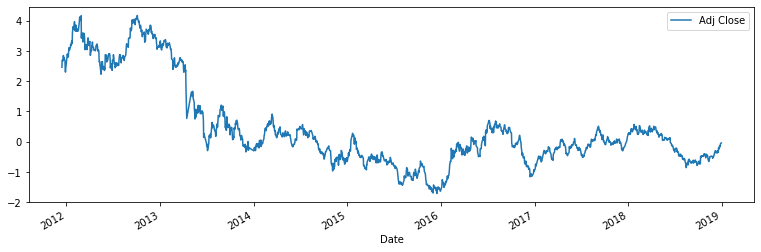

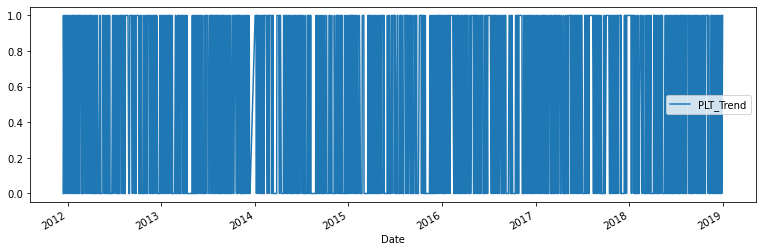

In [26]:
# Visualisation de la variable cible avec le prix du platine

dataframe.plot(y=['PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['PLT_Trend'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

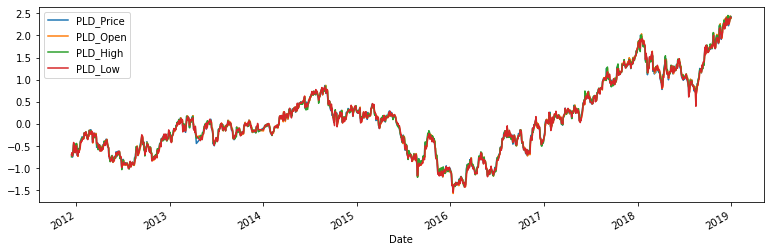

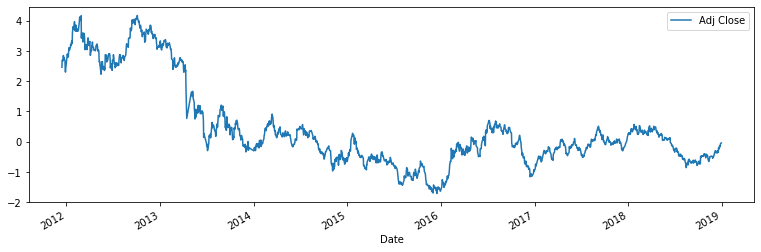

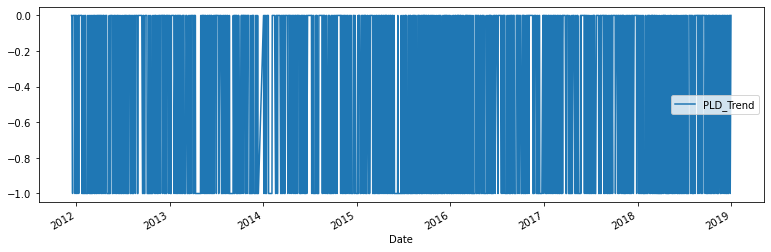

In [27]:
# Visualisation de la variable cible avec le prix du palladium

dataframe.plot(y=['PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['PLD_Trend'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

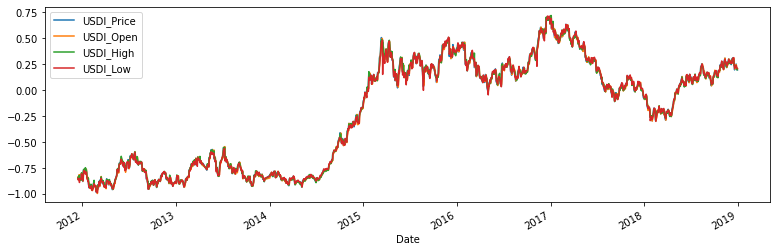

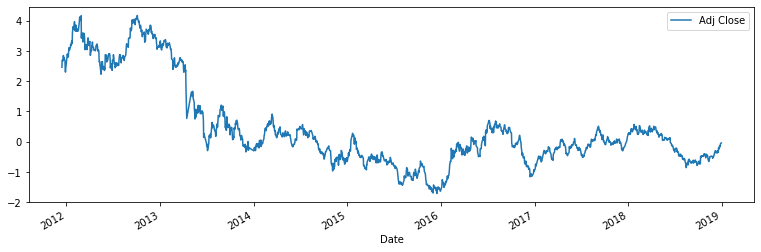

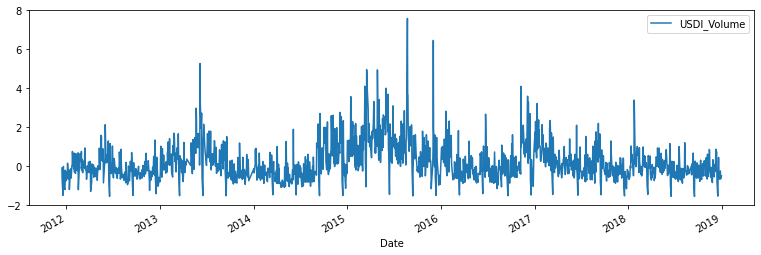

In [28]:
# Visualisation de la variable cible avec le prix de l'indice du dollars americain

dataframe.plot(y=['USDI_Price', 'USDI_Open', 'USDI_High', 'USDI_Low'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['USDI_Volume'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

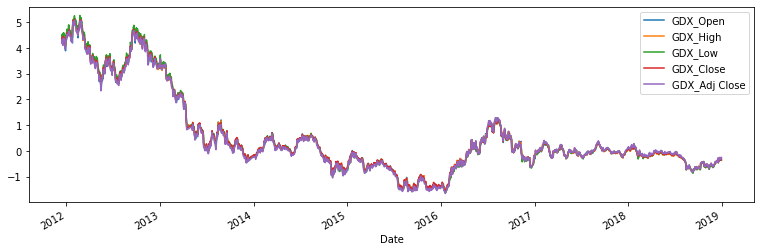

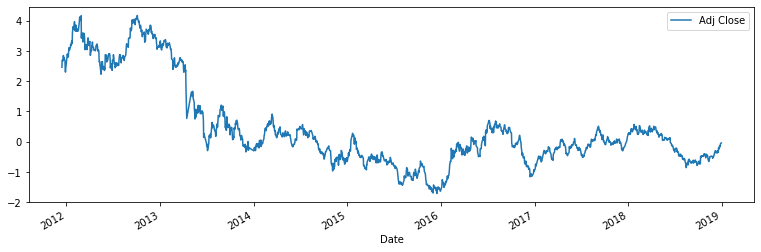

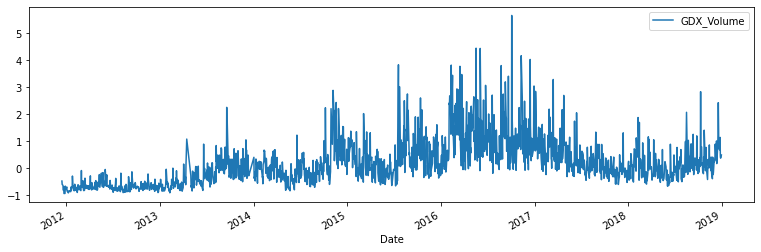

In [29]:
# Visualisation de la variable cible avec le prix de l'ETF Gold miners

dataframe.plot(y=['GDX_Open', 'GDX_High', 'GDX_Low', 'GDX_Close', 'GDX_Adj Close'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['GDX_Volume'], figsize=(13,4))

<AxesSubplot:xlabel='Date'>

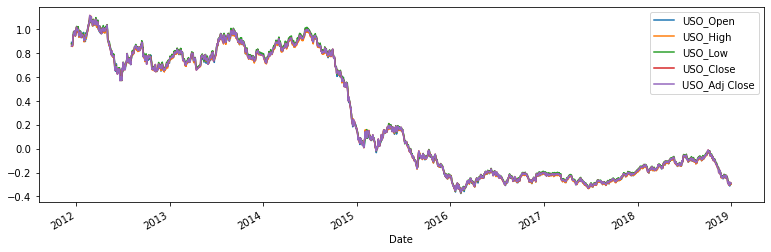

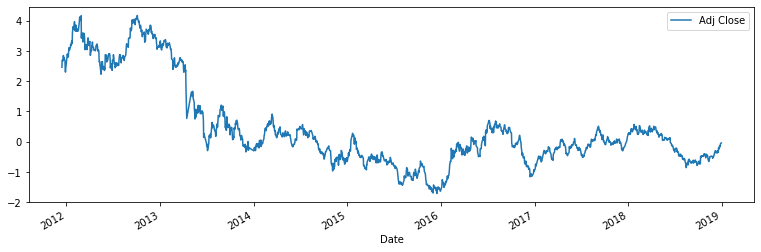

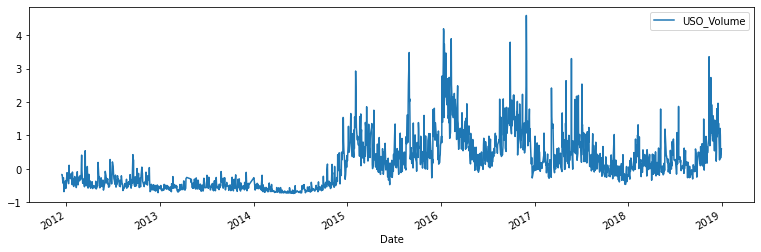

In [30]:
# Visualisation de la variable cible avec le prix de l'ETF petrolier USO

dataframe.plot(y=['USO_Open', 'USO_High', 'USO_Low', 'USO_Close', 'USO_Adj Close'], figsize=(13,4))
dataframe.plot(y=['Adj Close'], figsize=(13,4))
dataframe.plot(y=['USO_Volume'], figsize=(13,4))

In [31]:
def visualises(data, title):
    fig = px.line(title = title)
    for i in data.columns:
        fig.add_scatter(x=dataframe.index, y=dataframe[i], name=i)
        fig.update_xaxes(rangeslider_visible=True)
    fig.show()

In [32]:
visualises(dataframe,'Evolution des prix pour chaque variables')

### Correlation test

In [33]:
# premiere visualisation des correlations
correlation = dataframe.corr(method='pearson', min_periods=1)
correlation

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Open,1.000000,0.999515,0.999442,0.998976,0.998976,0.251921,-0.684314,-0.684597,-0.683464,-0.683998,...,0.975479,0.974596,0.974098,-0.514230,0.634872,0.634864,0.634277,0.635138,0.635138,-0.455920
High,0.999515,1.000000,0.999262,0.999535,0.999535,0.261064,-0.688118,-0.688365,-0.687325,-0.687817,...,0.975650,0.975341,0.974746,-0.508782,0.637101,0.637208,0.636538,0.637483,0.637483,-0.454913
Low,0.999442,0.999262,1.000000,0.999532,0.999532,0.237031,-0.680911,-0.681242,-0.679988,-0.680567,...,0.975337,0.974568,0.974182,-0.519988,0.633591,0.633623,0.633140,0.633994,0.633994,-0.457628
Close,0.998976,0.999535,0.999532,1.000000,1.000000,0.246778,-0.684618,-0.684904,-0.683750,-0.684284,...,0.975561,0.975459,0.974980,-0.514616,0.635197,0.635311,0.634732,0.635675,0.635675,-0.456193
Adj Close,0.998976,0.999535,0.999532,1.000000,1.000000,0.246778,-0.684618,-0.684904,-0.683750,-0.684284,...,0.975561,0.975459,0.974980,-0.514616,0.635197,0.635311,0.634732,0.635675,0.635675,-0.456193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
USO_High,0.634864,0.637208,0.633623,0.635311,0.635311,0.083064,-0.774626,-0.775482,-0.773550,-0.774799,...,0.614587,0.614766,0.600523,-0.522581,0.999857,1.000000,0.999818,0.999867,0.999867,-0.695678
USO_Low,0.634277,0.636538,0.633140,0.634732,0.634732,0.080475,-0.771235,-0.772154,-0.770087,-0.771396,...,0.613844,0.613931,0.599819,-0.523956,0.999848,0.999818,1.000000,0.999879,0.999879,-0.702665
USO_Close,0.635138,0.637483,0.633994,0.635675,0.635675,0.081642,-0.773099,-0.773957,-0.771928,-0.773159,...,0.614733,0.614915,0.600756,-0.523801,0.999699,0.999867,0.999879,1.000000,1.000000,-0.699221
USO_Adj Close,0.635138,0.637483,0.633994,0.635675,0.635675,0.081642,-0.773099,-0.773957,-0.771928,-0.773159,...,0.614733,0.614915,0.600756,-0.523801,0.999699,0.999867,0.999879,1.000000,1.000000,-0.699221


<AxesSubplot:title={'center':'Correlation avec Adj Close'}>

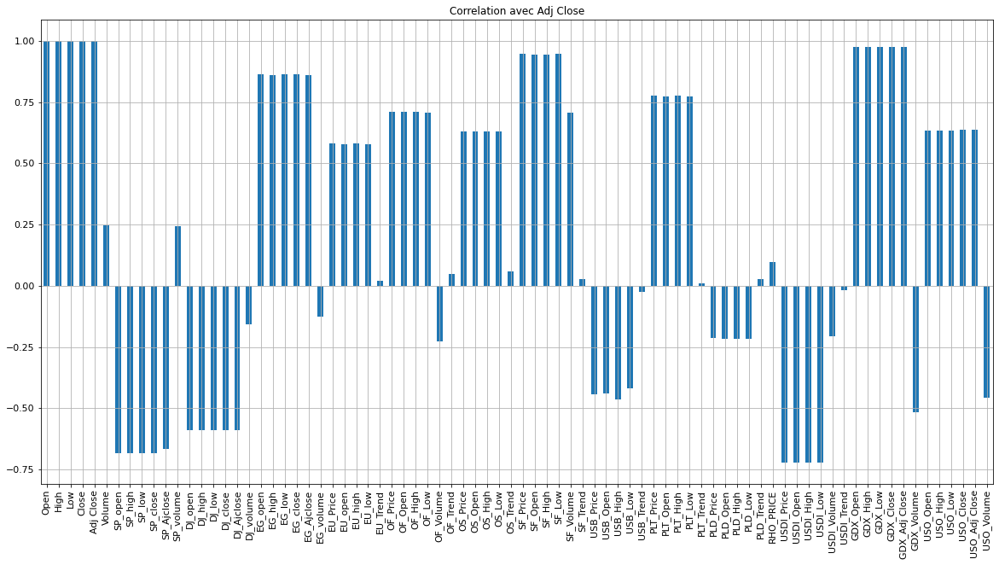

In [34]:
#2e visualisation des correlations celle-ci est plus adequate
pd.set_option('display.max_row',100)
pd.set_option('display.max_column',81)
#Pour l'affichage en entier
dataframe.corrwith(dataframe['Adj Close']).plot.bar(
        figsize = (20, 10), title = "Correlation avec Adj Close", fontsize = 11,
        rot = 90, grid = True)
#plt.savefig('Correlion_with_all_features.png', dpi=200) commande utiliser pour enregistrer la sortie sous forme d'image

In [35]:
correlation['Adj Close'].sort_values(ascending=True)

USDI_Low        -0.722078
USDI_Price      -0.721569
USDI_Open       -0.720140
USDI_High       -0.720023
SP_high         -0.684904
SP_open         -0.684618
SP_close        -0.684284
SP_low          -0.683750
SP_Ajclose      -0.666071
DJ_open         -0.588800
DJ_high         -0.588778
DJ_Ajclose      -0.588411
DJ_close        -0.588411
DJ_low          -0.588157
GDX_Volume      -0.514616
USB_High        -0.464116
USO_Volume      -0.456193
USB_Price       -0.441347
USB_Open        -0.440822
USB_Low         -0.417352
OF_Volume       -0.225436
PLD_High        -0.217490
PLD_Open        -0.216426
PLD_Low         -0.214919
PLD_Price       -0.213179
USDI_Volume     -0.205954
DJ_volume       -0.155526
EG_volume       -0.126586
USB_Trend       -0.025933
USDI_Trend      -0.016641
PLT_Trend        0.011355
EU_Trend         0.019913
PLD_Trend        0.026536
SF_Trend         0.028100
OF_Trend         0.048205
OS_Trend         0.059510
RHO_PRICE        0.095782
SP_volume        0.241949
Volume      

In [36]:
col_name = [dataframe.columns]

In [39]:
X_train, X_test, y_train, y_test = train_test_split(dataframe, dataframe['Adj Close'], test_size=0.33, random_state=1)

In [40]:
#var_selection = SelectKBest(f_regression, k=20)
var_selection.fit_transform(X_train,y_train)
anova_svm = LinearSVR()
anova_svm.fit(X_train,y_train)

C:\Users\iatrade\anaconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



LinearSVR()

In [51]:
#var_selection.get_support(indices=True)

In [52]:
#dataframe.columns[[ 0,  1,  2, 18, 19, 20, 21, 22, 40, 41, 42, 43, 51, 53, 54, 68, 69,
       #70, 71, 72]]

In [43]:
y_pred = anova_svm.predict(X_test)
#print(classification_report(y_test, y_pred))

In [44]:
result = pd.DataFrame(y_pred, y_test)
result

,0
Adj Close,
-0.482786,-0.482689
0.295148,0.295394
-0.165493,-0.165703
3.949668,3.949237
-0.053554,-0.053310
...,...
-0.913630,-0.913534
-0.535937,-0.536004
0.028589,0.028662


In [45]:
r2_score(y_test, y_pred)

0.9999999756215759

In [47]:

model = LinearRegression()
model.fit(X_train, y_train)
model.score(X_train, y_train)

1.0

In [49]:
y_pre = model.predict(X_test)
r2_score(y_test, y_pre)

1.0